<a href="https://colab.research.google.com/github/lrosasITBA/TPFinal_Rosas_Pellegrino/blob/main/TPFinalPy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
url = "https://data.insideairbnb.com/argentina/ciudad-aut%C3%B3noma-de-buenos-aires/buenos-aires/2024-04-28/visualisations/listings.csv"

In [ ]:
import pandas as pd
import altair as alt
df = pd.read_csv(url, low_memory=False)
(rows, cols) = df.shape
df.shape


(36561, 18)

In [ ]:
dolar_oficial = 874.23
df['dolares'] = df['price'] / dolar_oficial

<Axes: >

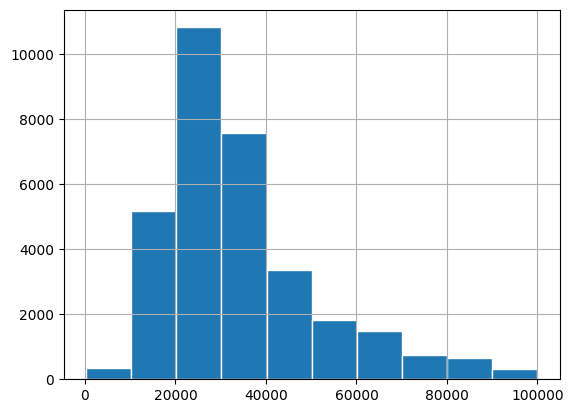

In [ ]:
df[df.price < 100000]["price"].hist(edgecolor = "white")


In [ ]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [ ]:
source = df.groupby("room_type").count()["id"].reset_index().rename(columns={"id": "count"})
alt.Chart(source).mark_bar().encode(
    x='count:Q',
    y=alt.Y('room_type:N',sort='-x')
)

alt.Chart(...)

In [ ]:
source = df[df.dolares <= 100]

alt.Chart(source).mark_bar().encode(
    alt.X("dolares:Q", bin=True),
    y='count()',
)

#large data sets, ver



alt.Chart(...)

In [ ]:
url= "https://data.insideairbnb.com/argentina/ciudad-aut%C3%B3noma-de-buenos-aires/buenos-aires/2024-04-28/visualisations/listings.csv"
import pandas as pd

In [ ]:
listings = pd.read_csv(url)

<ipython-input-8-ae3c363d5383>:1: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  listings = pd.read_csv(url)


In [ ]:
# Agrupar por localidad y sumar las reviews del último mes
reviews_per_month_by_neighbourhood = listings.groupby('neighbourhood')['reviews_per_month'].sum().sort_values(ascending=False)

# Filtrar el top 15 de localidades
top15_reviews_per_month_by_neighbourhood = reviews_per_month_by_neighbourhood.head(15)

# Mostrar el resultado
top15_reviews_per_month_by_neighbourhood


neighbourhood
Palermo         16164.09
Recoleta         6347.07
San Nicolas      3438.66
Retiro           2116.94
Monserrat        2060.62
Belgrano         1963.73
Villa Crespo     1326.90
San Telmo        1305.35
Balvanera        1198.62
Almagro          1191.13
Nuñez             827.58
Colegiales        760.75
Chacarita         684.73
Caballito         570.71
Constitucion      537.40
Name: reviews_per_month, dtype: float64

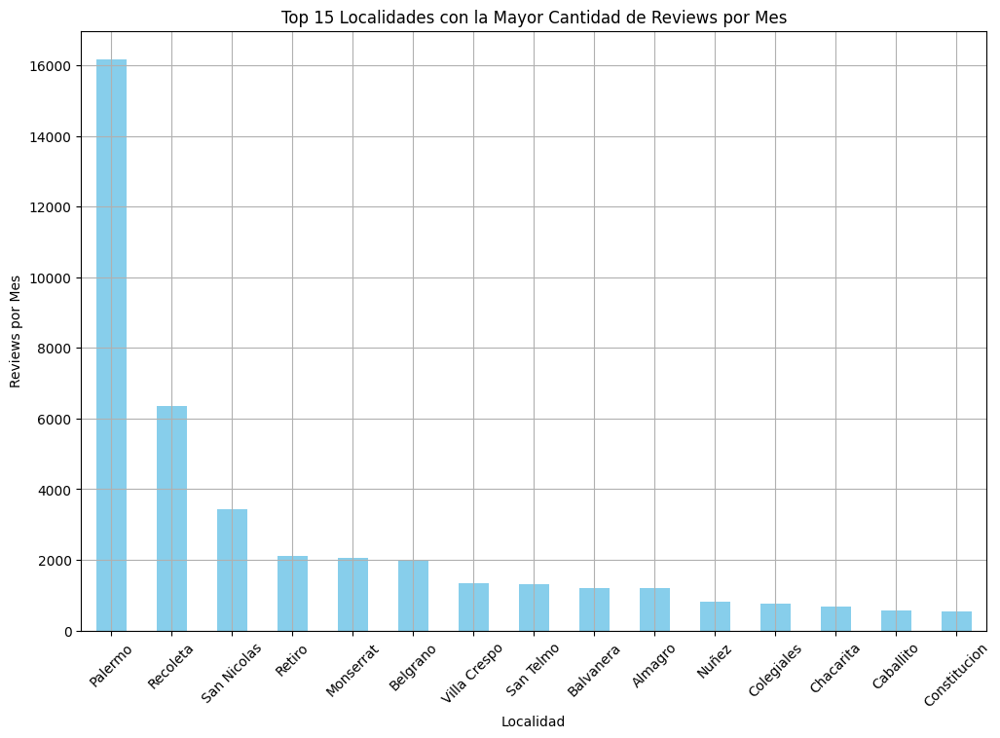

In [ ]:
import matplotlib.pyplot as plt

# Crear el gráfico de barras
plt.figure(figsize=(12, 8))
top15_reviews_per_month_by_neighbourhood.plot(kind='bar', color='skyblue')
plt.title('Top 15 Localidades con la Mayor Cantidad de Reviews por Mes')
plt.xlabel('Localidad')
plt.ylabel('Reviews por Mes')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Filtrar el top 15 de listados por reviews en el último mes
top15_reviews_last_month = listings.nlargest(15, 'reviews_per_month')

# Mostrar el resultado
top15_reviews_last_month[['name', 'reviews_per_month']]


,name,reviews_per_month
27264,Estudio en Puerto Madero,53.47
26860,Tres Ambientes c/Balcon en Barrio Norte,21.38
9373,Modern studio apartment in Palermo Hollywood,18.68
23184,Monoambiente en Palermo Hollywood con Balcon,18.33
13805,Increíble apartamento completo en P. Hollywood,16.64
33433,Departamento a nuevo en Palermo,16.29
12850,Departamento en San Telmo,16.14
13107,Monoambiente completo en Palermo Hollywood,16.10
14027,"Clayton Prince Suite, without Polo view",14.59
23222,Depto Dos Ambientes en Palermo Hollywood,14.01


In [ ]:
# Filtrar el top 15 de listados por cantidad total de reviews
top15_total_reviews = listings.nlargest(15, 'number_of_reviews')

# Mostrar el resultado
top15_total_reviews[['name', 'number_of_reviews']]


,name,number_of_reviews
9373,Modern studio apartment in Palermo Hollywood,813
847,Heart Of Buenos Aires,715
207,OBELISCO. CORAZÓN DEL MICROCENTRO! 5 estrellas!,538
3010,Monoambiente completo en CABA,520
435,The Best Place To Live BuenosAires!,498
2722,Amplio apartamento completo en CABA,492
3707,"Lovely appt, vip Buenos Aires area, w pool !",473
245,Ubicación pleno centro 2 ambientes balcón,466
43,Central to Everything,451
1045,Apartment in Palermo Cañitas,429


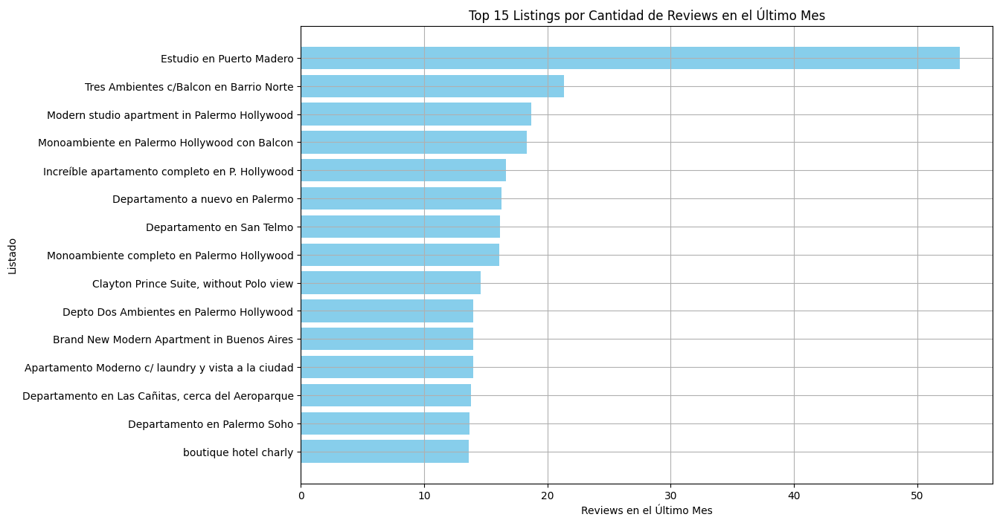

In [ ]:
import matplotlib.pyplot as plt

# Crear el gráfico de barras
plt.figure(figsize=(12, 8))
plt.barh(top15_reviews_last_month['name'], top15_reviews_last_month['reviews_per_month'], color='skyblue')
plt.title('Top 15 Listings por Cantidad de Reviews en el Último Mes')
plt.xlabel('Reviews en el Último Mes')
plt.ylabel('Listado')
plt.gca().invert_yaxis()  # Invertir el eje y para que el mayor esté arriba
plt.grid(True)
plt.show()


In [ ]:
# Filtrar el top 15 de listados por cantidad total de reviews
top15_total_reviews = listings.nlargest(15, 'number_of_reviews')

# Mostrar el resultado
top15_total_reviews[['name', 'number_of_reviews']]


,name,number_of_reviews
9373,Modern studio apartment in Palermo Hollywood,813
847,Heart Of Buenos Aires,715
207,OBELISCO. CORAZÓN DEL MICROCENTRO! 5 estrellas!,538
3010,Monoambiente completo en CABA,520
435,The Best Place To Live BuenosAires!,498
2722,Amplio apartamento completo en CABA,492
3707,"Lovely appt, vip Buenos Aires area, w pool !",473
245,Ubicación pleno centro 2 ambientes balcón,466
43,Central to Everything,451
1045,Apartment in Palermo Cañitas,429


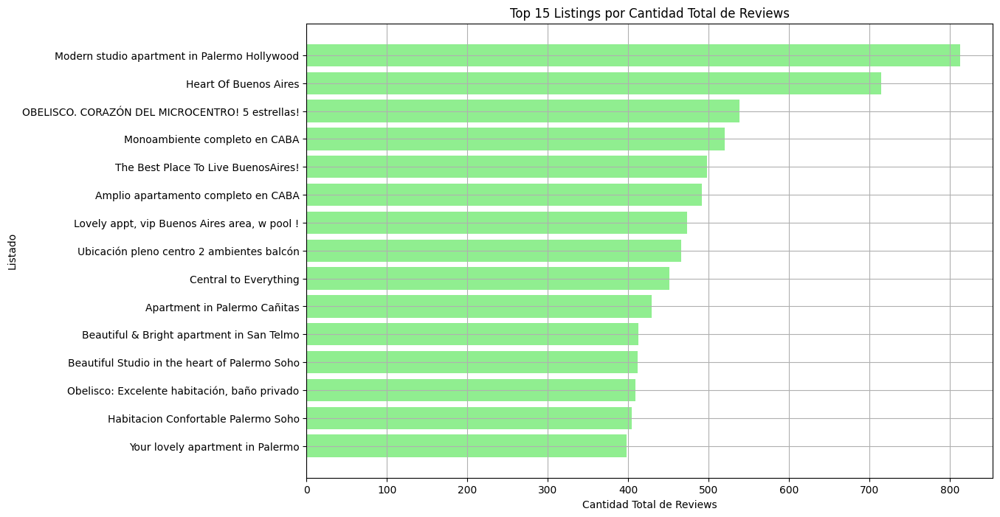

In [ ]:
# Crear el gráfico de barras
plt.figure(figsize=(12, 8))
plt.barh(top15_total_reviews['name'], top15_total_reviews['number_of_reviews'], color='lightgreen')
plt.title('Top 15 Listings por Cantidad Total de Reviews')
plt.xlabel('Cantidad Total de Reviews')
plt.ylabel('Listado')
plt.gca().invert_yaxis()  # Invertir el eje y para que el mayor esté arriba
plt.grid(True)
plt.show()


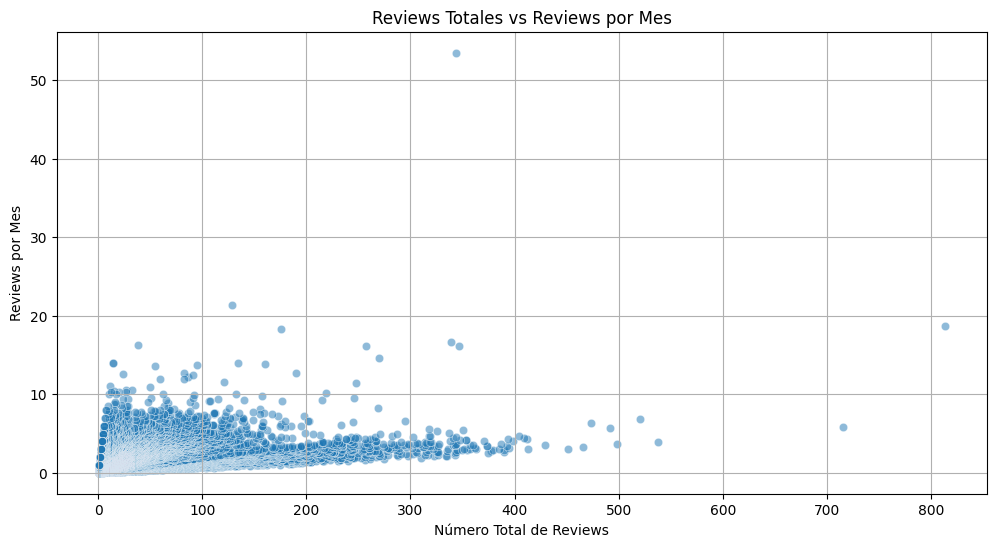

In [ ]:

plt.figure(figsize=(12, 6))
sns.scatterplot(x='number_of_reviews', y='reviews_per_month', data=listings, alpha=0.5)
plt.title('Reviews Totales vs Reviews por Mes')
plt.xlabel('Número Total de Reviews')
plt.ylabel('Reviews por Mes')
plt.grid(True)
plt.show()


In [ ]:
# Filtrar listados con al menos una review en el último mes y en total
listings = listings[(listings['reviews_per_month'] > 0) & (listings['number_of_reviews'] > 0)]

# Calcular el cambio de actividad
listings['change_in_activity'] = listings['reviews_per_month'] / listings['number_of_reviews']


In [ ]:
# Seleccionar el top 10 de listados con mayor cambio de actividad
top10_change_in_activity = listings.nlargest(10, 'change_in_activity')


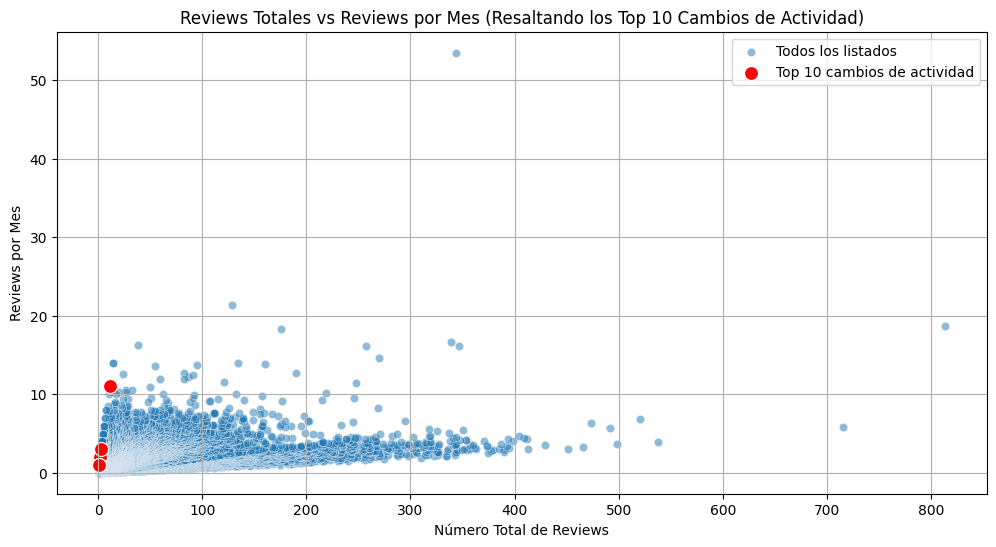

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear el scatter plot
plt.figure(figsize=(12, 6))
sns.scatterplot(x='number_of_reviews', y='reviews_per_month', data=listings, alpha=0.5, label='Todos los listados')
sns.scatterplot(x='number_of_reviews', y='reviews_per_month', data=top10_change_in_activity, color='red', s=100, label='Top 10 cambios de actividad')
plt.title('Reviews Totales vs Reviews por Mes (Resaltando los Top 10 Cambios de Actividad)')
plt.xlabel('Número Total de Reviews')
plt.ylabel('Reviews por Mes')
plt.legend()
plt.grid(True)
plt.show()


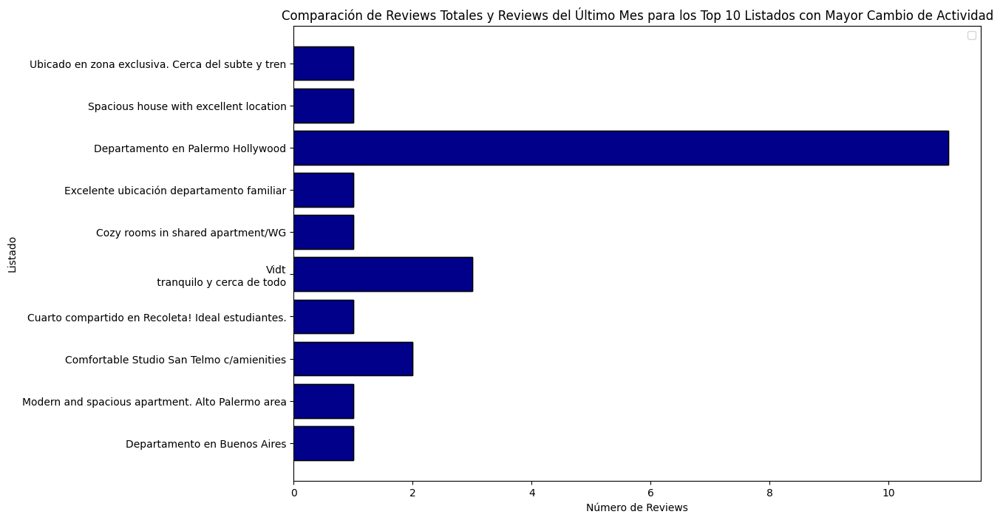

In [ ]:
import matplotlib.pyplot as plt

# Configuración del gráfico de barras
fig, ax = plt.subplots(figsize=(12, 8))

# Comparar las reviews totales con las reviews del último mes
for i, row in top10_change_in_activity.iterrows():
    ax.barh(row['name'], row['number_of_reviews'], color='lightblue', edgecolor='black', label='Total Reviews' if i == 0 else "")
    ax.barh(row['name'], row['reviews_per_month'], color='darkblue', edgecolor='black', label='Reviews Last Month' if i == 0 else "")

# Personalización del gráfico
ax.set_title('Comparación de Reviews Totales y Reviews del Último Mes para los Top 10 Listados con Mayor Cambio de Actividad')
ax.set_xlabel('Número de Reviews')
ax.set_ylabel('Listado')
ax.legend()
plt.show()


In [ ]:
host_listings_count = listings.groupby(['host_id', 'host_name'])['id'].count().reset_index()
host_listings_count.columns = ['host_id', 'host_name', 'listings_count']

top30_hosts = host_listings_count.nlargest(30, 'listings_count')


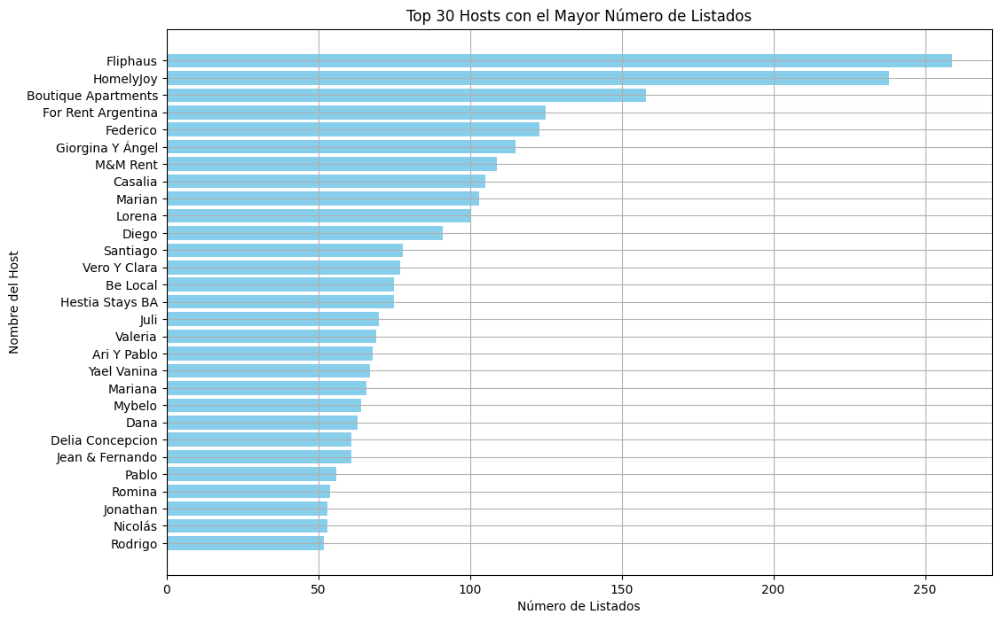

In [ ]:
import matplotlib.pyplot as plt

# Crear el gráfico de barras
plt.figure(figsize=(12, 8))
plt.barh(top30_hosts['host_name'], top30_hosts['listings_count'], color='skyblue')
plt.title('Top 30 Hosts con el Mayor Número de Listados')
plt.xlabel('Número de Listados')
plt.ylabel('Nombre del Host')
plt.gca().invert_yaxis()  # Invertir el eje y para que el mayor esté arriba
plt.grid(True)
plt.show()


In [ ]:
# Filtrar los listados de los top 30 hosts
top30_hosts_listings = listings[listings['host_id'].isin(top30_hosts['host_id'])]

# Seleccionar los listados más caros de estos hosts
top_listings_of_top30_hosts = top30_hosts_listings.nlargest(30, 'price')


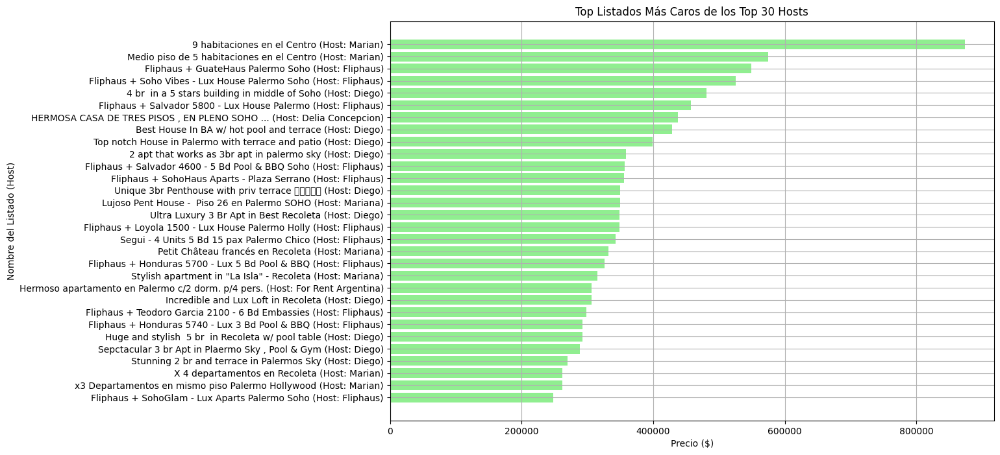

In [ ]:
import matplotlib.pyplot as plt

# Crear el gráfico de barras
plt.figure(figsize=(12, 8))
plt.barh(top_listings_of_top30_hosts['name'] + ' (Host: ' + top_listings_of_top30_hosts['host_name'] + ')', top_listings_of_top30_hosts['price'], color='lightgreen')
plt.title('Top Listados Más Caros de los Top 30 Hosts')
plt.xlabel('Precio ($)')
plt.ylabel('Nombre del Listado (Host)')
plt.gca().invert_yaxis()  # Invertir el eje y para que el mayor esté arriba
plt.grid(True)
plt.show()
